In [3]:
from loaders.Loaders import CSVLoader
from compoundFeaturization.rdkitFingerprints import MorganFingerprint
from featureSelection.baseFeatureSelector import LowVarianceFS
from unsupervised.baseUnsupervised import PCA, TSNE, KMeans

In [4]:
dataset = CSVLoader(dataset_path='preprocessed_dataset_wfoodb.csv', 
                    mols_field='Smiles', 
                    labels_fields='Class', 
                    id_field='ID')#, shard_size=4000)
dataset = dataset.create_dataset()
dataset.get_shape()

Mols_shape:  23290
Features_shape:  X not defined!
Labels_shape:  (23290,)


In [5]:
#Featurization
dataset = MorganFingerprint().featurize(dataset)
dataset.get_shape()

Featurizing datapoint 0
Featurizing datapoint 1000
Featurizing datapoint 2000
Featurizing datapoint 3000
Featurizing datapoint 4000
Featurizing datapoint 5000
Featurizing datapoint 6000


RDKit ERROR: [14:14:38] Explicit valence for atom # 1 Cl, 4, is greater than permitted


error in smile: O=[Cl]=O
Featurizing datapoint 7000


RDKit ERROR: [14:14:42] Explicit valence for atom # 3 B, 4, is greater than permitted
RDKit ERROR: [14:14:42] Explicit valence for atom # 1 Cl, 9, is greater than permitted


error in smile: OB1O[B]2(O)OB(O)O[B](O)(O1)O2
error in smile: O=[Cl-](=O)(=O)=O
Featurizing datapoint 8000
Featurizing datapoint 9000
Featurizing datapoint 10000
Featurizing datapoint 11000
Featurizing datapoint 12000
Featurizing datapoint 13000
Featurizing datapoint 14000


RDKit ERROR: [14:14:57] Explicit valence for atom # 0 P, 11, is greater than permitted


error in smile: [P](OCC=C(C)C)(OCC=C(C)C)(=O)(OP(OCC=C(C)C)(OCC=C(C)C)=O)(CC=C(C)C)(CC=C(C)C)(CC=C(C)C)(CC=C(C)C)(CC=C(C)C)CC=C(C)C
Featurizing datapoint 15000
Featurizing datapoint 16000
Featurizing datapoint 17000
Featurizing datapoint 18000
Featurizing datapoint 19000
Featurizing datapoint 20000
Featurizing datapoint 21000
Featurizing datapoint 22000
Featurizing datapoint 23000
Elements with indexes:  [6257, 7708, 7709, 14244]  were removed due to the presence of NAs!
The elements in question are:  ['O=[Cl]=O' 'OB1O[B]2(O)OB(O)O[B](O)(O1)O2' 'O=[Cl-](=O)(=O)=O'
 '[P](OCC=C(C)C)(OCC=C(C)C)(=O)(OP(OCC=C(C)C)(OCC=C(C)C)=O)(CC=C(C)C)(CC=C(C)C)(CC=C(C)C)(CC=C(C)C)(CC=C(C)C)CC=C(C)C']
Mols_shape:  23286
Features_shape:  (23286, 1024)
Labels_shape:  (23286,)


In [6]:
#PCA
dataset = PCA(n_components=5).runUnsupervised(dataset)

print(dataset.get_shape())

2 Components PCA: 



 

3 Components PCA: 



 

5 Components PCA: 



 

Explained Variance: 


Mols_shape:  23286
Features_shape:  (23286, 5)
Labels_shape:  (23286,)
None


In [ ]:
#TSNE
#dataset = TSNE(n_components=3).runUnsupervised(dataset)

#print(dataset.get_shape())

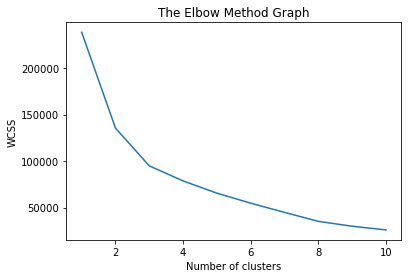

Creating a K-means cluster with 3 clusters...


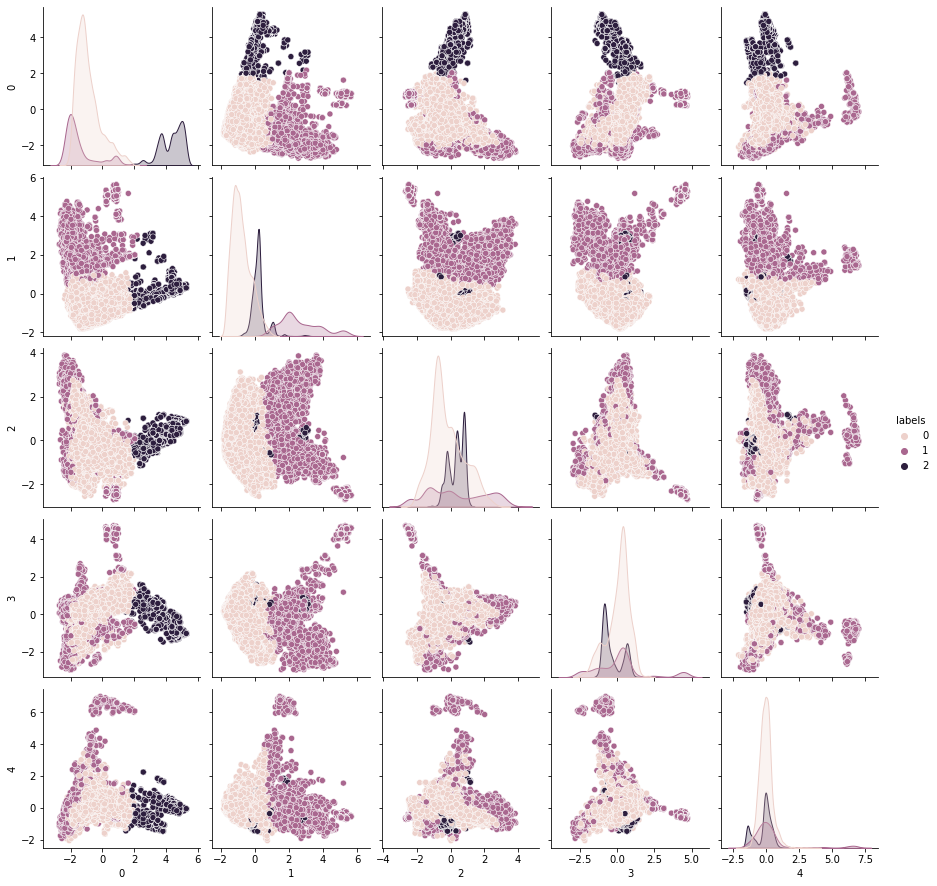

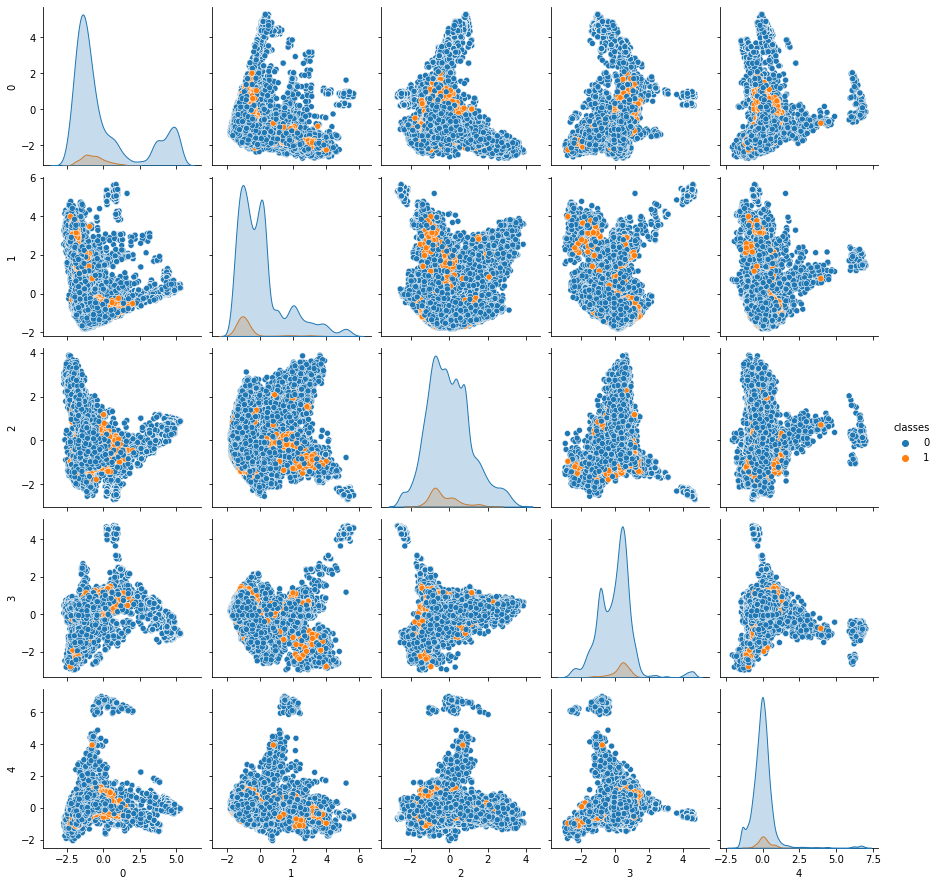

In [7]:
#KMeans
kmeans= KMeans().runUnsupervised(dataset)

In [4]:
import pandas as pd

dset = pd.read_csv("sweetness_dataset.csv")
dset["smiles"].to_csv("smiles.csv",index=False)

In [7]:
import rdkit
rdkit.__version__

'2020.09.1'

In [6]:
dset = pd.read_csv("smiles.csv")
dset

,smiles
0,COC(=O)C(CC(=O)OC(C)C)NC(=O)C(N)CC(=O)O
1,CC(C)C[C@H](N)C(=O)N[C@@H](CC(C)C)C(O)=O
2,COc1ccc(cc1)C(C)=O
3,[O-][N+](=O)c1ccccc1
4,CNc1ccccc1C(=O)OC
...,...
38589,CC(=O)OC(=O)CCC(=O)NC(C)CCCCOCCO
38590,CCCOC(=O)OCCCCC[SH](C)(=O)CC=CCO
38591,COC(=O)OC(=O)C(N)C(=O)NC(C)C(=O)CCCCO
38592,OCC1=S(O)[SH](CSc2ccccc2Cl)CC1
